<a href="https://colab.research.google.com/github/nauraalwa/drowsiness-detection/blob/main/Drowsy_Detection_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Download dataset from Roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Kbtn0LbUbJg1aD2TwrWX")
project = rf.workspace("ozge-7wehd").project("yolov8_dataset-hrf1x")
version = project.version(6)
dataset = version.download("yolov8") # does this give the path

print(dataset)

loading Roboflow workspace...
loading Roboflow project...


Install packages

In [ ]:
!pip install ultralytics

from ultralytics import YOLO
import os
import torch
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 68.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

See the data

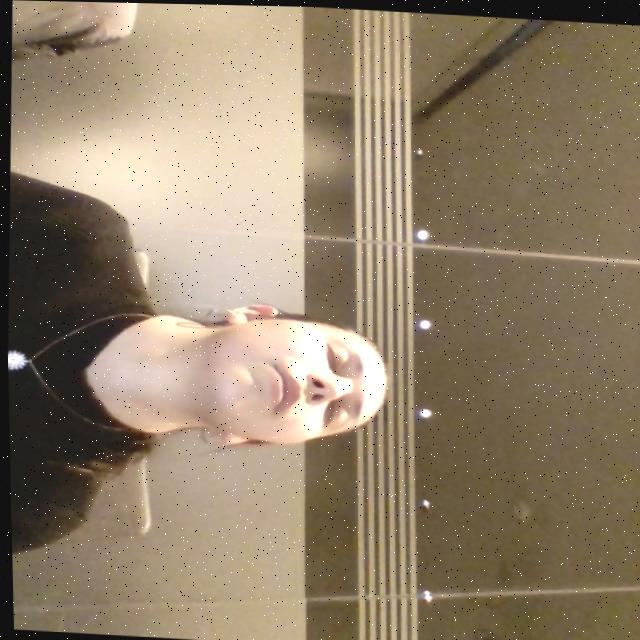

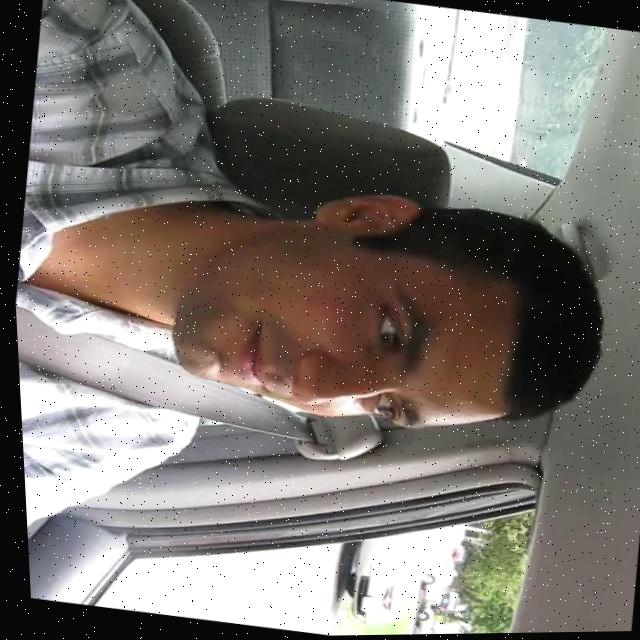

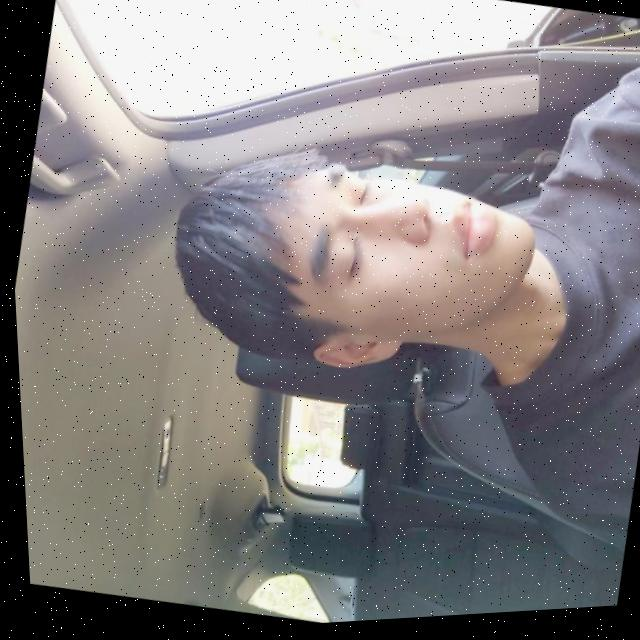

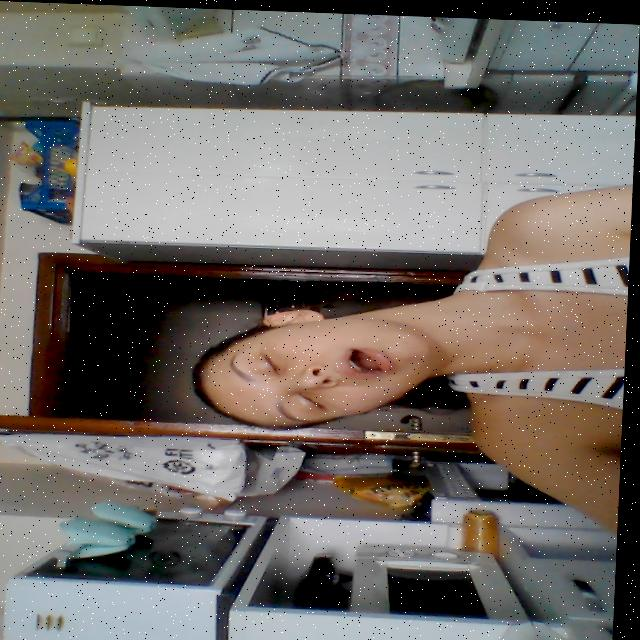

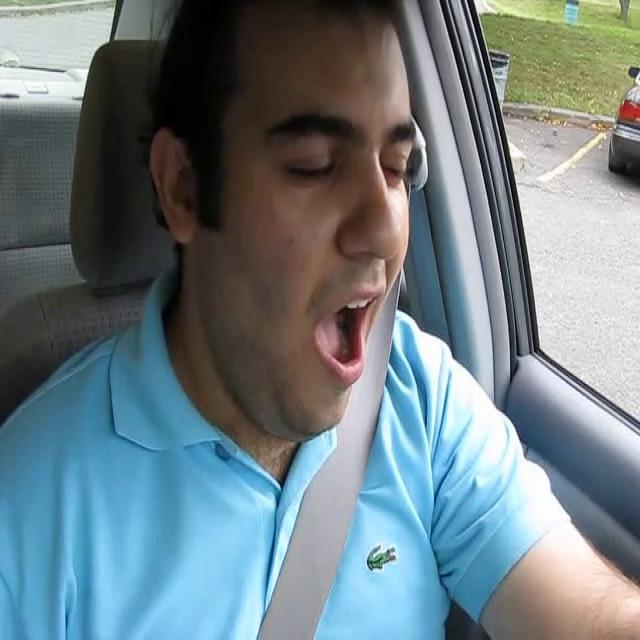

In [ ]:
imgs_dir = "yolov8_dataset-6/train/images"

for file in os.listdir(imgs_dir)[:5]:
  img_path = os.path.join(imgs_dir, file)
  img = cv2.imread(img_path)
  cv2_imshow(img)

Train our YOLOv8 model

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

#start YOLO training
model = YOLO("yolov8s.pt")
model.train(data="/content/yolov8_dataset-6/data.yaml",epochs=20, imgsz=640, batch=16, dropout=0.2, label_smoothing=0.1)

WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.128 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolov8_dataset-6/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.2, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=

100%|██████████| 755k/755k [00:00<00:00, 139MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

Model summary: 129 layers, 11,136,761 parameters, 11,136,745 gradients, 28.7 GFLOPs

Transferred 349/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 292MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 22.3±10.2 MB/s, size: 54.2 KB)


train: Scanning /content/yolov8_dataset-6/train/labels... 3789 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3789/3789 [00:07<00:00, 534.11it/s]


train: New cache created: /content/yolov8_dataset-6/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 20.7±12.8 MB/s, size: 45.9 KB)


val: Scanning /content/yolov8_dataset-6/valid/labels... 360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 360/360 [00:00<00:00, 618.53it/s]


val: New cache created: /content/yolov8_dataset-6/valid/labels.cache
Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train4
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.69G      1.359      1.919      1.598         27        640: 100%|██████████| 237/237 [01:21<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:04<00:00,  2.71it/s]


                   all        360        360       0.72       0.76      0.813      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      4.48G      1.339      1.379       1.53         27        640: 100%|██████████| 237/237 [01:13<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.49it/s]

                   all        360        360       0.81      0.813      0.869      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      4.52G      1.338      1.344      1.509         33        640: 100%|██████████| 237/237 [01:11<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.42it/s]

                   all        360        360      0.853      0.856      0.937      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      4.55G      1.284      1.232      1.461         30        640: 100%|██████████| 237/237 [01:12<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.39it/s]

                   all        360        360      0.929      0.885      0.948      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      4.59G      1.218      1.116      1.418         34        640: 100%|██████████| 237/237 [01:12<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.25it/s]

                   all        360        360      0.885      0.918      0.947      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      4.63G      1.169      1.036      1.383         29        640: 100%|██████████| 237/237 [01:11<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]

                   all        360        360      0.933      0.962      0.979      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      4.66G       1.13     0.9558      1.354         28        640: 100%|██████████| 237/237 [01:11<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.26it/s]

                   all        360        360      0.944      0.922       0.98      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20       4.7G      1.098     0.9333       1.33         24        640: 100%|██████████| 237/237 [01:12<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.51it/s]

                   all        360        360      0.942      0.956      0.977      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      4.74G      1.061      0.898      1.311         31        640: 100%|██████████| 237/237 [01:11<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.45it/s]

                   all        360        360      0.928      0.946      0.969      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      4.77G      1.045      0.844      1.294         30        640: 100%|██████████| 237/237 [01:11<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.47it/s]

                   all        360        360      0.951      0.959      0.981      0.803


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      4.81G     0.9324     0.5696      1.339         13        640: 100%|██████████| 237/237 [01:11<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.29it/s]

                   all        360        360      0.965      0.967      0.987      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      4.85G     0.8816     0.5205       1.31         13        640: 100%|██████████| 237/237 [01:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:04<00:00,  3.00it/s]

                   all        360        360       0.95      0.951      0.979      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      4.88G     0.8523     0.4947      1.268         13        640: 100%|██████████| 237/237 [01:09<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.57it/s]

                   all        360        360      0.942      0.953      0.969        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      4.92G     0.8263     0.4551      1.256         13        640: 100%|██████████| 237/237 [01:10<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.52it/s]

                   all        360        360      0.976      0.967      0.985      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      4.96G     0.7935     0.4272       1.23         13        640: 100%|██████████| 237/237 [01:10<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.13it/s]

                   all        360        360       0.96      0.959      0.983      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      4.99G     0.7615     0.4164      1.201         13        640: 100%|██████████| 237/237 [01:09<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.11it/s]

                   all        360        360      0.964      0.974      0.988      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      5.03G     0.7402      0.389       1.18         13        640: 100%|██████████| 237/237 [01:09<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.61it/s]

                   all        360        360      0.986       0.98       0.99      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      5.06G     0.7153     0.3628      1.163         13        640: 100%|██████████| 237/237 [01:10<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.52it/s]

                   all        360        360      0.984      0.984       0.99      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20       5.1G     0.6907     0.3356      1.151         13        640: 100%|██████████| 237/237 [01:10<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:04<00:00,  2.96it/s]

                   all        360        360      0.986      0.972      0.992      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      5.14G     0.6645     0.3233      1.131         13        640: 100%|██████████| 237/237 [01:10<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:03<00:00,  3.28it/s]

                   all        360        360      0.979      0.983      0.989      0.848



20 epochs completed in 0.421 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 22.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.128 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:05<00:00,  2.33it/s]


                   all        360        360      0.979      0.983      0.989      0.848
                 awake        123        123      0.954      0.992      0.987       0.84
                drowsy        111        111      0.991       0.96       0.99      0.846
                  yawn        126        126      0.992      0.999      0.989      0.859
Speed: 0.2ms preprocess, 4.6ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f5a52d73d50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

Analyze train results

In [ ]:
# get the results csv
results_csv = pd.read_csv("runs/detect/train4/results.csv")

# get the first 5 rows
results_csv.head()

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,85.6251,1.35902,1.91921,1.59791,0.71973,0.75956,0.81302,0.51642,1.22214,1.44077,1.59196,0.000474,0.000474,0.000474
1,2,163.1620,1.33899,1.37882,1.53048,0.81011,0.81323,0.86874,0.60635,1.03871,0.94599,1.43485,0.000904,0.000904,0.000904
2,3,239.2480,1.33831,1.34405,1.50946,0.85345,0.85632,0.93691,0.60284,1.17494,0.90281,1.56278,0.001286,0.001286,0.001286
3,4,315.7520,1.28402,1.23230,1.46068,0.92941,0.88525,0.94823,0.68907,0.99200,0.70547,1.34448,0.001217,0.001217,0.001217
4,5,392.2180,1.21781,1.11631,1.41766,0.88502,0.91813,0.94698,0.73518,0.87516,0.63291,1.28026,0.001146,0.001146,0.001146


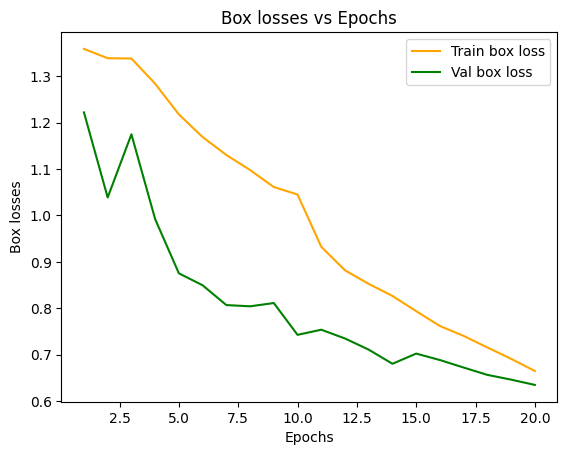

In [ ]:
# plot box losses vs epochs
plt.plot(range(1,21), results_csv["train/box_loss"], color="orange", label="Train box loss")
plt.plot(range(1,21), results_csv["val/box_loss"], color="green", label="Val box loss")
plt.xlabel("Epochs")
plt.ylabel("Box losses")
plt.title("Box losses vs Epochs")
plt.legend()

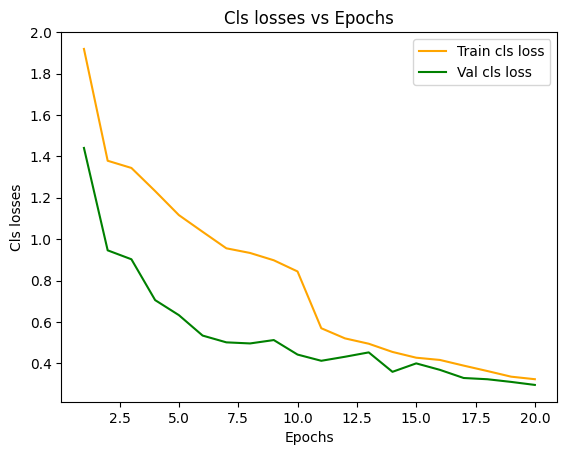

In [ ]:
# plot cls losses vs epochs
plt.plot(range(1, 21), results_csv["train/cls_loss"], color= "orange", label= "Train cls loss")
plt.plot(range(1, 21), results_csv["val/cls_loss"], color= "green", label= "Val cls loss")
plt.xlabel("Epochs")
plt.ylabel("Cls losses")
plt.title("Cls losses vs Epochs")
plt.legend()

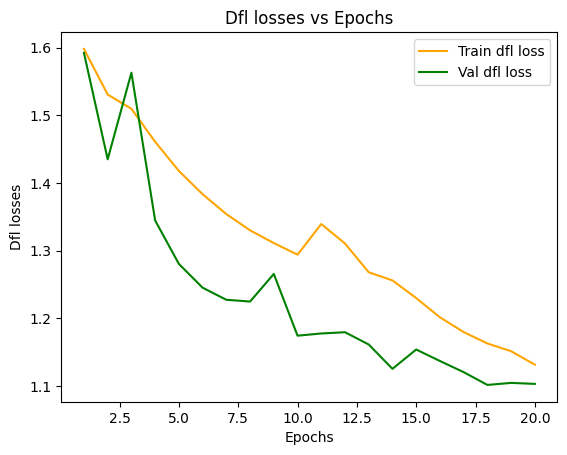

In [ ]:
# plot dfl losses vs epochs
plt.plot(range(1, 21), results_csv["train/dfl_loss"], color= "orange", label= "Train dfl loss")
plt.plot(range(1, 21), results_csv["val/dfl_loss"], color= "green", label= "Val dfl loss")
plt.xlabel("Epochs")
plt.ylabel("Dfl losses")
plt.title("Dfl losses vs Epochs")
plt.legend()

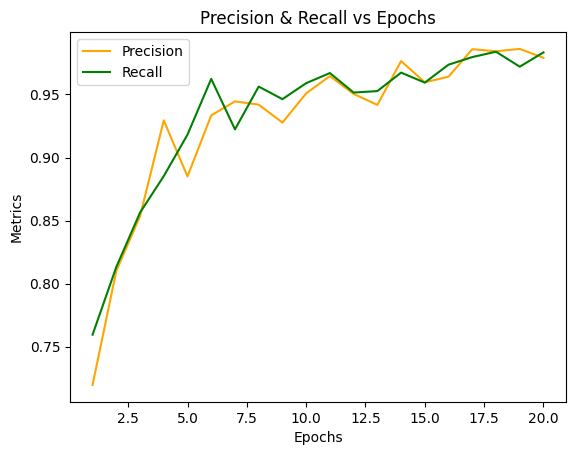

In [ ]:
# plot precision & recall vs epochs
plt.plot(range(1, 21), results_csv["metrics/precision(B)"], color= "orange", label= "Precision")
plt.plot(range(1, 21), results_csv["metrics/recall(B)"], color= "green", label= "Recall")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.title("Precision & Recall vs Epochs")
plt.legend()

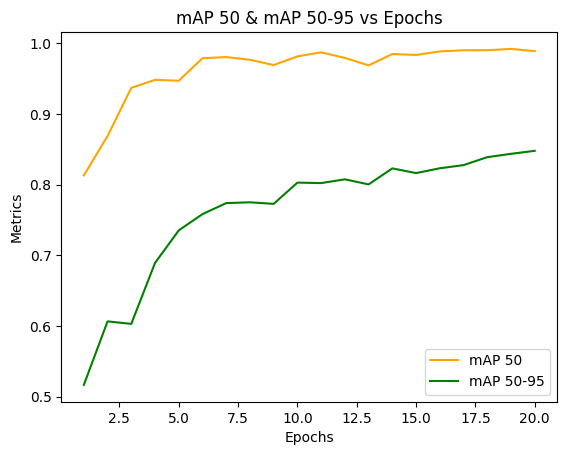

In [ ]:
# plot map 50 and map 50-95 vs epochs
plt.plot(range(1, 21), results_csv["metrics/mAP50(B)"], color= "orange", label= "mAP 50")
plt.plot(range(1, 21), results_csv["metrics/mAP50-95(B)"], color= "green", label= "mAP 50-95")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.title("mAP 50 & mAP 50-95 vs Epochs")
plt.legend()

Validate the trained model

In [ ]:
# validate the trained model
model = YOLO("runs/detect/train4/weights/best.pt")
model.val(data="/content/yolov8_dataset-6/data.yaml")

Ultralytics 8.3.128 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1240.5±490.0 MB/s, size: 44.4 KB)


val: Scanning /content/yolov8_dataset-6/valid/labels.cache... 360 images, 0 backgrounds, 0 corrupt: 100%|██████████| 360/360 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.53it/s]


                   all        360        360      0.979      0.983      0.989      0.847
                 awake        123        123      0.954      0.992      0.987      0.841
                drowsy        111        111      0.991      0.959       0.99      0.844
                  yawn        126        126      0.992      0.999      0.989      0.855
Speed: 1.5ms preprocess, 9.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f5a5266bc50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

Analyze validation results

In [ ]:
# see the validation results
os.listdir("runs/detect/val")

['confusion_matrix.png',
 'confusion_matrix_normalized.png',
 'val_batch1_labels.jpg',
 'val_batch2_labels.jpg',
 'P_curve.png',
 'val_batch0_labels.jpg',
 'F1_curve.png',
 'R_curve.png',
 'val_batch1_pred.jpg',
 'val_batch2_pred.jpg',
 'PR_curve.png',
 'val_batch0_pred.jpg']

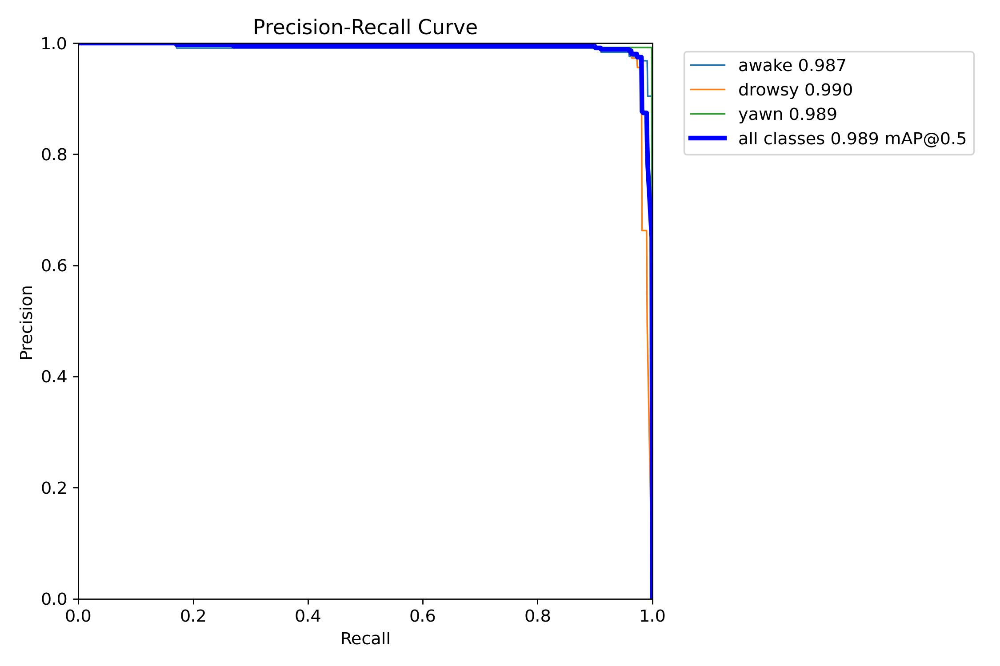

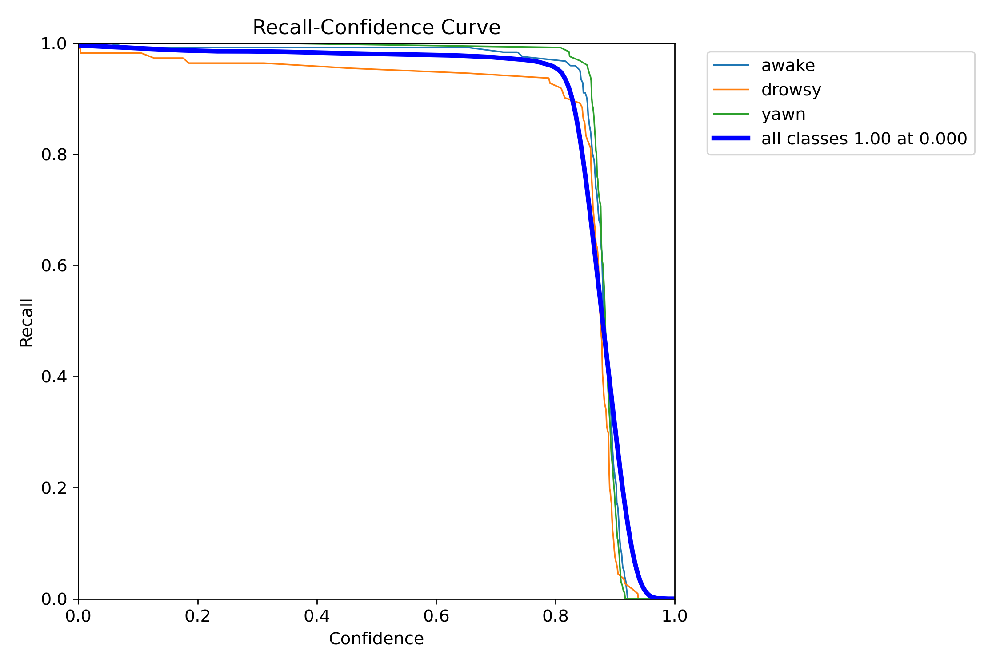

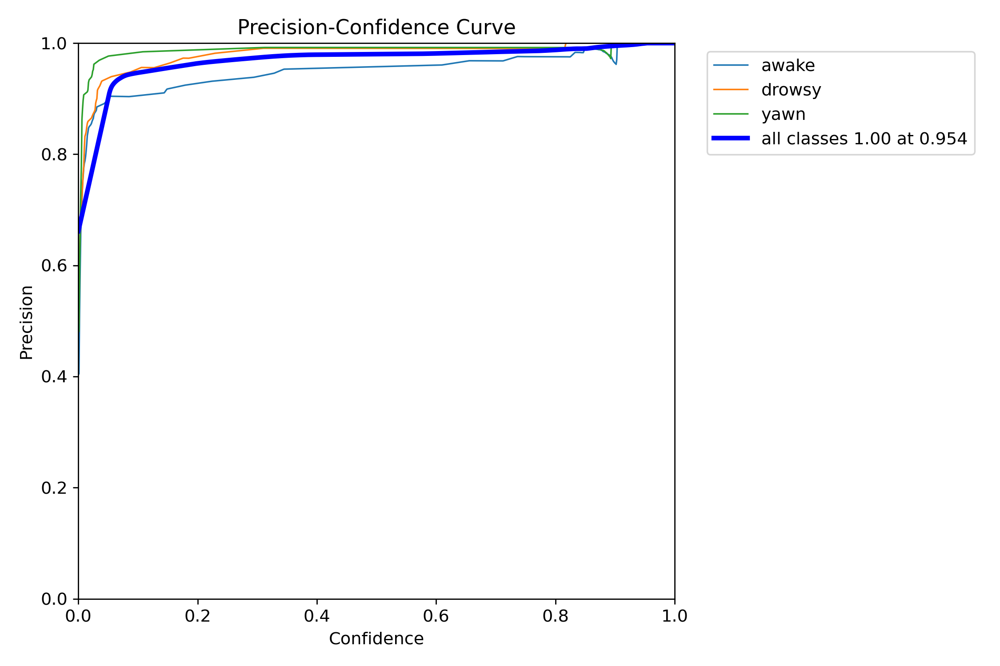

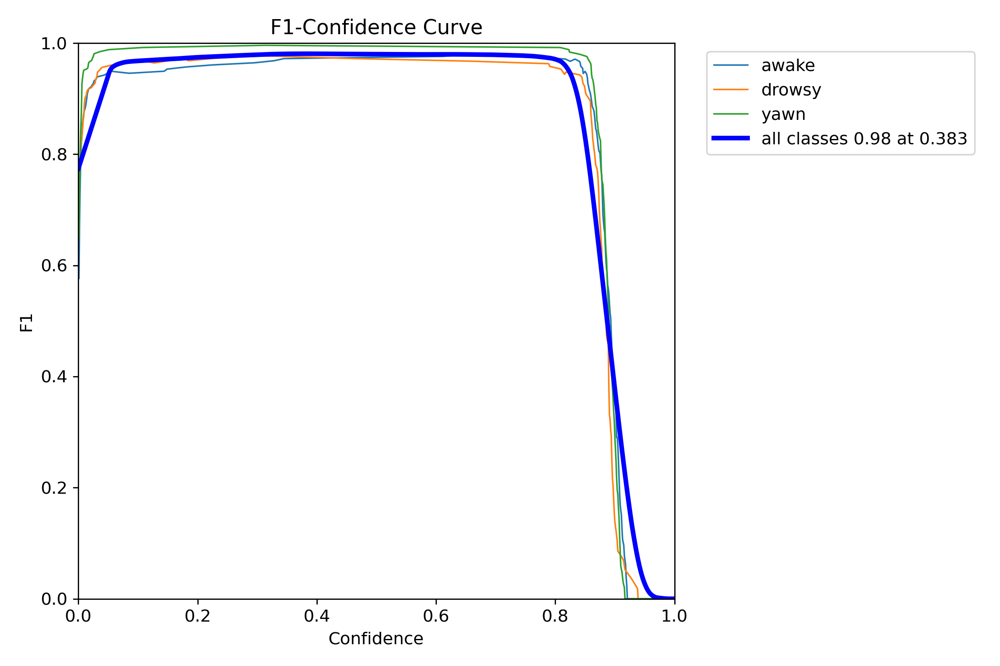

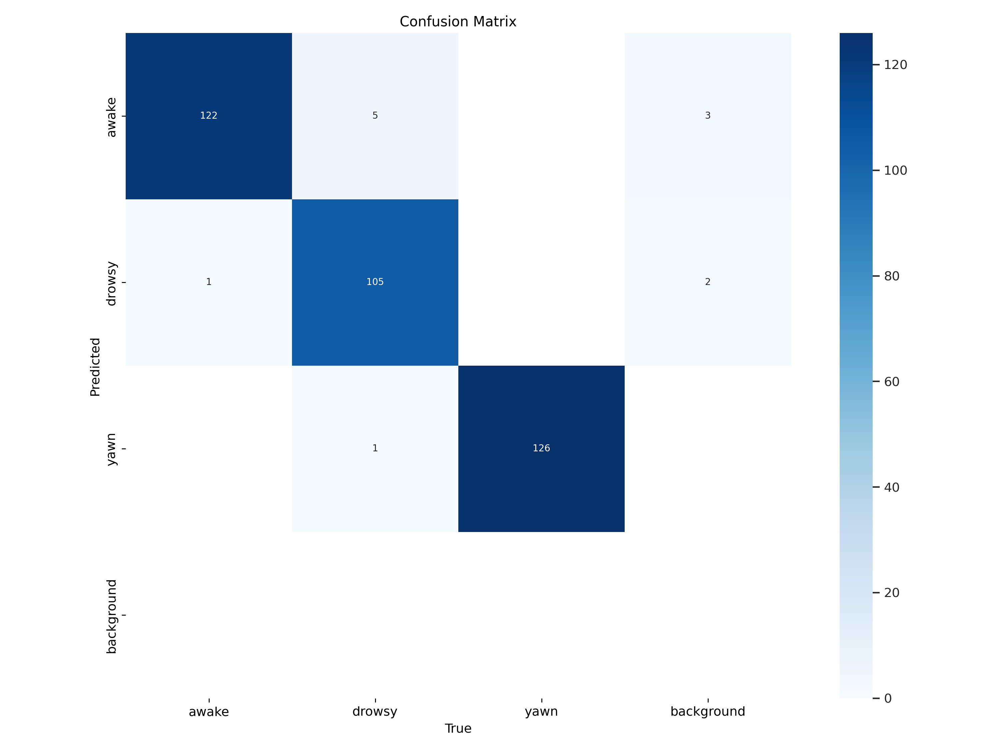

In [ ]:
#show the images of the graphs
val_dir = "runs/detect/val"

files = ["PR_curve.png", "R_curve.png", "P_curve.png", "F1_curve.png", "confusion_matrix.png"]

for file_name in files:
  img = cv2.imread(os.path.join(val_dir, file_name))
  cv2_imshow(img)
  print("\n")

Test the model

In [ ]:
model = YOLO("runs/detect/train4/weights/best.pt")
model.predict(
    source="/content/yolov8_dataset-6/test/images", conf=0.25 , save=True
)


image 1/188 /content/yolov8_dataset-6/test/images/102_jpg.rf.676c46820a6a0df0feff9c20f8a5ad62.jpg: 640x640 1 yawn, 16.3ms
image 2/188 /content/yolov8_dataset-6/test/images/1032_jpg.rf.aaa3842fe4d516ac9cacf28080124890.jpg: 640x640 1 awake, 16.0ms
image 3/188 /content/yolov8_dataset-6/test/images/1038_jpg.rf.945e1b283482f64bea843c6d23d98c15.jpg: 640x640 1 awake, 15.9ms
image 4/188 /content/yolov8_dataset-6/test/images/1120_jpg.rf.c7bdda4b1c13ae8486b5b08ea425fa7f.jpg: 640x640 1 awake, 15.9ms
image 5/188 /content/yolov8_dataset-6/test/images/112_jpg.rf.a6b99ebd21075c3a6c728a7d89ce3a95.jpg: 640x640 1 yawn, 15.9ms
image 6/188 /content/yolov8_dataset-6/test/images/113_jpg.rf.dcaac2afdcf62a92347699614e386f59.jpg: 640x640 1 yawn, 15.9ms
image 7/188 /content/yolov8_dataset-6/test/images/114_jpg.rf.2b7eef0af418c94e40d414a292f972a8.jpg: 640x640 1 yawn, 15.9ms
image 8/188 /content/yolov8_dataset-6/test/images/115_jpg.rf.35fff243dffd6d8ed461f47a087c1292.jpg: 640x640 1 yawn, 15.9ms
image 9/188 /cont

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'awake', 1: 'drowsy', 2: 'yawn'}
 obb: None
 orig_img: array([[[ 20,  16,  15],
         [ 20,  16,  15],
         [ 20,  16,  15],
         ...,
         [ 72,  72,  72],
         [ 72,  72,  72],
         [ 72,  72,  72]],
 
        [[ 20,  16,  15],
         [ 20,  16,  15],
         [ 20,  16,  15],
         ...,
         [ 72,  72,  72],
         [ 72,  72,  72],
         [ 72,  72,  72]],
 
        [[ 20,  16,  15],
         [ 20,  16,  15],
         [ 20,  16,  15],
         ...,
         [ 72,  72,  72],
         [ 72,  72,  72],
         [ 72,  72,  72]],
 
        ...,
 
        [[181, 172, 169],
         [170, 161, 158],
         [148, 139, 136],
         ...,
         [ 34,  34,  34],
         [ 34,  34,  34],
         [ 34,  34,  34]],
 
        [[179, 170, 167],
         [167, 158, 155],
         [144, 135, 132],
         

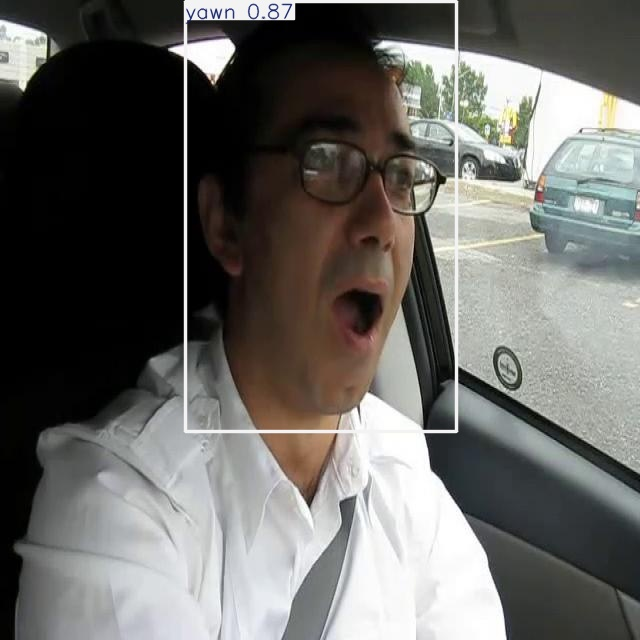

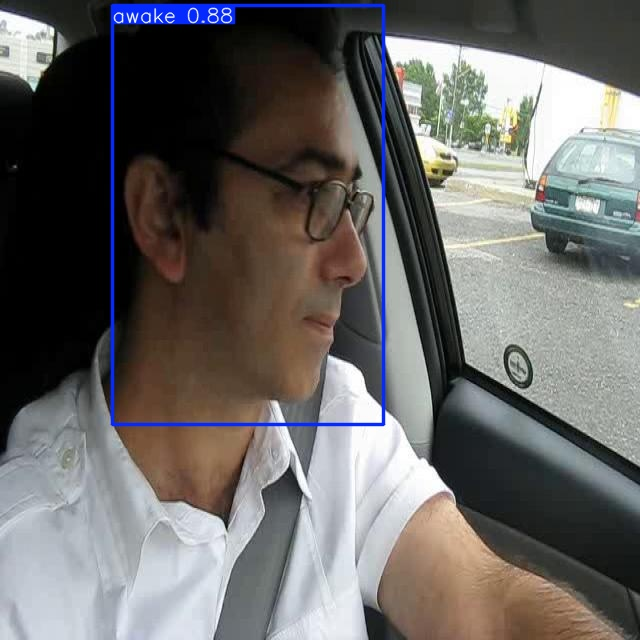

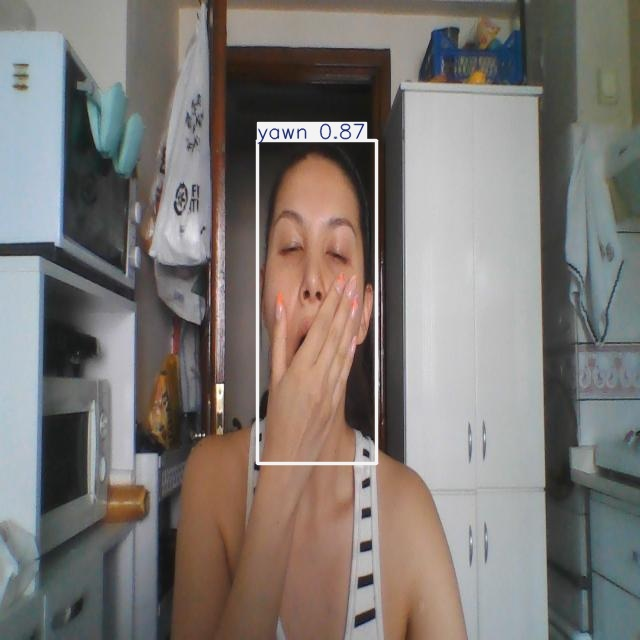

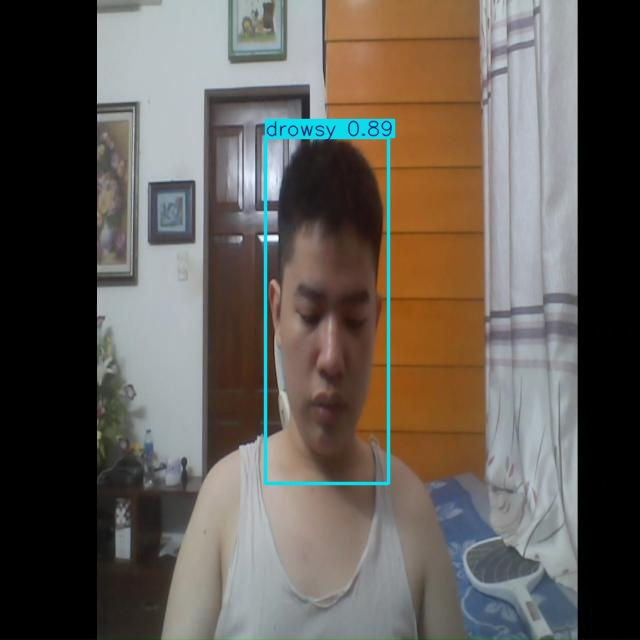

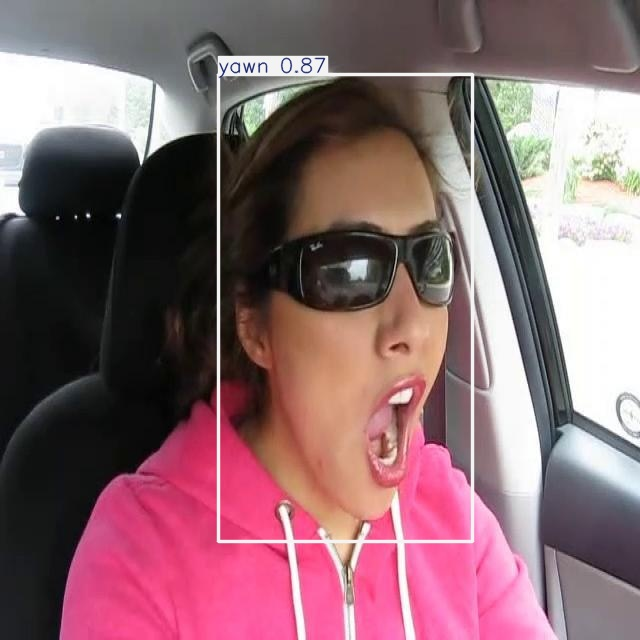

...

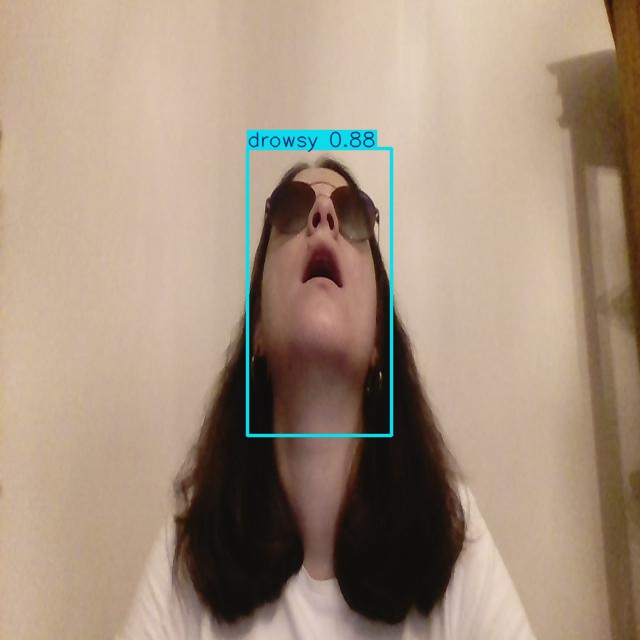

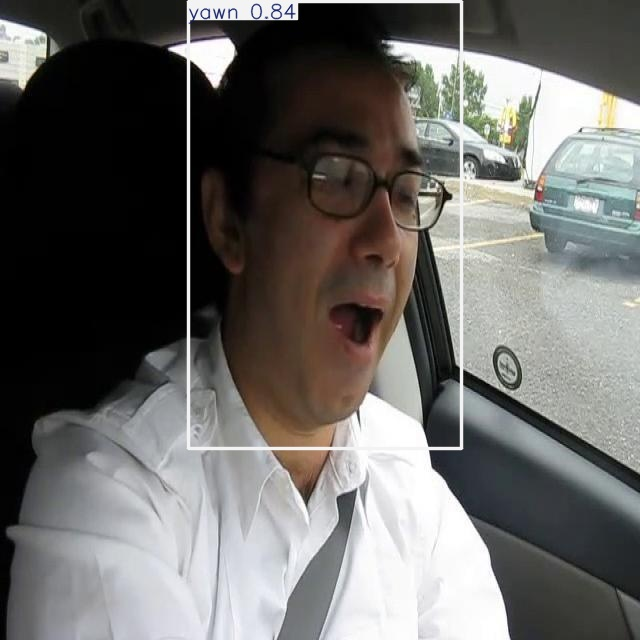

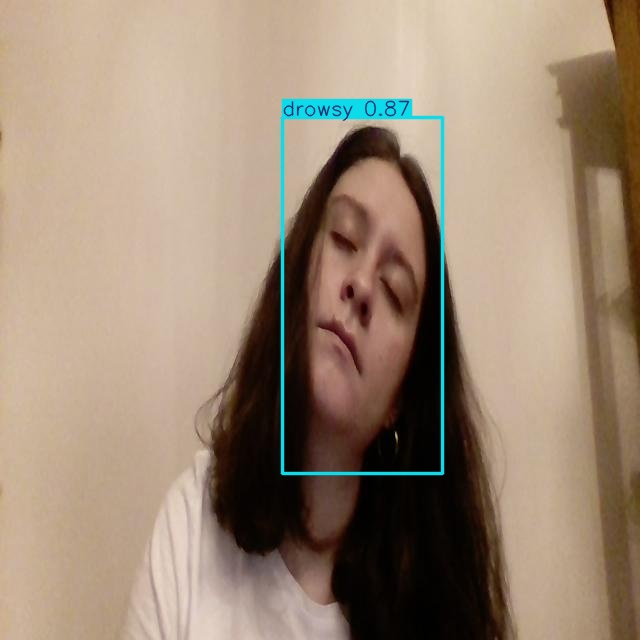

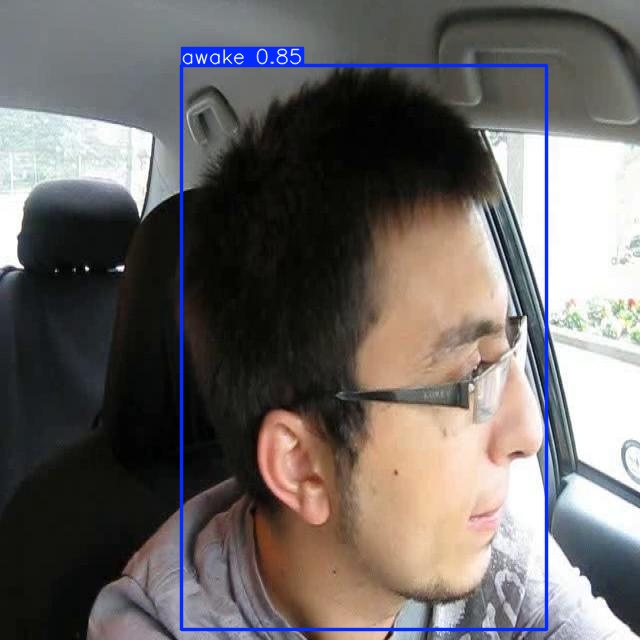

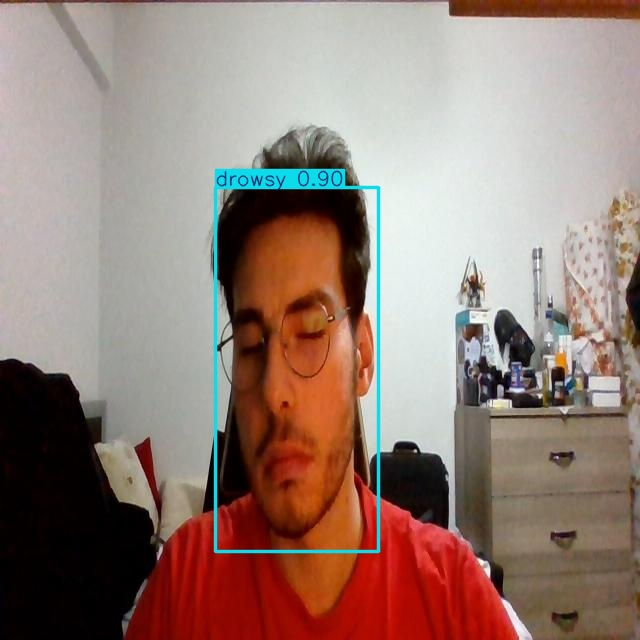

In [ ]:
pred_dir = "runs/detect/predict"

for file in os.listdir(pred_dir)[35:50]:
  img = cv2.imread(os.path.join(pred_dir, file))
  cv2_imshow(img)

  print("\n")

Real Time Detection

In [ ]:
import cv2

# Check for available cameras
available_cameras = []
for i in range(10):  # Check up to 10 cameras
    cap = cv2.VideoCapture(i)
    if cap.isOpened():
        available_cameras.append(i)
        cap.release()

print("Available camera indices:", available_cameras)

Available camera indices: []


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

cap = cv2.VideoCapture(0)
while cap.isOpened():
    ret, frame = cap.read()

    # Make detections
    results = model(frame)

    # Use cv2_imshow instead of cv2.imshow for Colab compatibility
    cv2_imshow(np.squeeze(results.render()))

    if cv2.waitKey(10) & 0xFF == ord('q'):
        break
cap.release()

# cv2.destroyAllWindows() is not needed in Colab
# Instead, interrupt the kernel to stop the loop and close the displayed image